<a href="https://colab.research.google.com/github/lahirumanulanka/ann-visual-emotion/blob/created_new_dataset/Balanced_Emotion_Dataset_generation_with_generative_aI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [15]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [16]:
# =========================
# Cell 0 — Install deps
# =========================
!pip -q install --upgrade diffusers transformers accelerate torch torchvision pillow tqdm scikit-learn

In [17]:
# =========================
# Cell 1 — Imports & Drive
# =========================
import os, json, random, math, shutil
from pathlib import Path
from typing import Dict, List, Optional, Tuple

import torch
from PIL import Image, ImageStat, ImageFilter
from tqdm import tqdm

# Colab: mount Google Drive
try:
    from google.colab import drive
    drive.mount('/content/drive', force_remount=True)
except Exception as e:
    print("Not running in Colab or Drive mount failed:", e)

print("CUDA available:", torch.cuda.is_available())

Mounted at /content/drive
CUDA available: True


In [18]:
# =========================
# Cell 2 — Config (EDIT ME)
# =========================
# Set your project root inside Google Drive
GDRIVE_PROJECT_ROOT = Path("/content/drive/MyDrive/ann-visual-emotion")

# Raw image root (one subfolder per emotion)
RAW_DIR = GDRIVE_PROJECT_ROOT / "data" / "raw" / "EmoSet"   # e.g., .../EmoSet/amusement, anger, ...

# Option A: Use an existing stats.json (recommended if you track counts)
STATS_JSON = GDRIVE_PROJECT_ROOT / "data" / "processed" / "EmoSet_splits" / "stats.json"     # edit if needed

# Option B: If you don't have stats.json, set USE_STATS_JSON=False to count from folders
USE_STATS_JSON = STATS_JSON.exists()

# Target images per class (minimum after generation)
TARGET_PER_CLASS = 2000

# Optional CSV output (if you want to re-split after balancing)
CSV_OUT_DIR = GDRIVE_PROJECT_ROOT / "data" / "processed" / "EmoSet_splits"
CSV_OUT_DIR.mkdir(parents=True, exist_ok=True)

# Rebuild splits after generation?
REBUILD_SPLITS = True          # set False if you don't need CSVs
VAL_RATIO       = 0.10         # 10% validation
TEST_RATIO      = 0.10         # 10% test

# Generation params
MODEL_NAME     = "runwayml/stable-diffusion-v1-5"
DEVICE         = "cuda" if torch.cuda.is_available() else "cpu"
BATCH_SIZE     = 4
STEPS          = 30
GUIDANCE       = 7.5
IMG_W, IMG_H   = 512, 512
SEED           = 1234          # for reproducibility, or set to None
MAX_ATTEMPT_MULTIPLIER = 3     # up to 3× attempts if quality filter rejects images

RAW_DIR.mkdir(parents=True, exist_ok=True)
print("RAW_DIR:", RAW_DIR)
print("STATS_JSON exists:", STATS_JSON.exists())

RAW_DIR: /content/drive/MyDrive/ann-visual-emotion/data/raw/EmoSet
STATS_JSON exists: True


In [19]:
# ==========================================
# Cell 3 — Your style, negatives, attributes
# ==========================================
CORE_STYLE = (
    "ultra-detailed RAW color photo, 85mm lens, shallow depth of field, "
    "studio portrait, highly detailed skin, pores visible, sharp eyes, "
    "soft key light, rim light, natural color grading"
)

NEGATIVE = (
    "low-res, blurry, deformed face, extra fingers, extra limbs, cropped head, "
    "over-saturated, watermark, text, logo, jpeg artifacts, disfigured, doll-like, "
    "unrealistic skin, severe shadow banding"
)

AGES = ["teenager", "young adult", "adult", "middle-aged", "senior"]
GENDERS = ["woman", "man", "non-binary person"]
SKIN_TONES = [
    "very fair skin", "fair skin", "medium skin", "olive skin",
    "brown skin", "dark brown skin", "very dark skin"
]
HAIR = ["short hair", "long hair", "curly hair", "straight hair", "tied hair", "shaved head"]
LIGHTS = [
    "softbox lighting", "natural window light", "butterfly lighting",
    "Rembrandt lighting", "cinematic lighting", "overcast daylight"
]

# Extra variety knobs (keeps faces front-and-center but adds nuance)
CAMERA_VARIANTS = ["tight headshot", "close-up portrait", "framing shoulders and head"]
BACKGROUND      = ["plain backdrop", "neutral studio background", "soft gradient background"]
HEAD_POSE       = ["looking straight at camera", "slightly turned head", "three-quarter view"]
MAKEUP          = ["natural makeup", "no makeup", "light makeup"]

# Expanded emotion verbs (richer variety)
EMOTION_VERBS: Dict[str, List[str]] = {
    "amusement": [
        "laughing", "smiling with joy", "amused grin", "eyes crinkled in laughter",
        "playful chuckle", "burst of laughter", "broad smile with teeth showing",
        "delighted grin", "cheeky smirk"
    ],
    "anger": [
        "angry expression", "furious glare", "tense jaw", "brows furrowed in anger",
        "clenched teeth", "yelling in rage", "hostile stare", "face flushed with anger",
        "tightened lips in fury"
    ],
    "awe": [
        "awe-struck expression", "eyes wide in wonder", "astonished look", "breath taken in awe",
        "jaw dropped in amazement", "gazing upward in astonishment", "overcome with wonder",
        "stunned expression"
    ],
    "contentment": [
        "content smile", "relaxed and satisfied", "peaceful expression", "calm gentle smile",
        "serene look", "restful expression", "subtle satisfied grin", "pleasant calm demeanor",
        "soft eyes with ease"
    ],
    "disgust": [
        "disgusted expression", "nose wrinkled", "upper lip raised", "eyes squinting in disgust",
        "face twisted with revulsion", "looking repulsed", "mouth curled in distaste",
        "turning away in disgust"
    ],
    "excitement": [
        "excited expression", "sparkling eyes", "cheerful wide smile", "thrilled look",
        "bursting with energy", "ecstatic grin", "face lit with joy", "bouncing with excitement",
        "eyes shining with thrill"
    ],
    "fear": [
        "fearful expression", "eyes widened in fear", "tense mouth", "startled face",
        "frightened gasp", "alarmed stare", "mouth open in shock", "terrified expression",
        "nervous glance"
    ],
    "sadness": [
        "sad expression", "teary eyes", "downturned mouth", "gloomy look",
        "eyes filled with sorrow", "crying softly", "melancholy gaze", "face heavy with grief",
        "pensive sadness"
    ],
}

In [20]:
# ==========================================
# Cell 4 — Prompt builder & quality filter
# ==========================================
def make_prompt(emotion: str) -> str:
    a = random.choice(AGES)
    g = random.choice(GENDERS)
    s = random.choice(SKIN_TONES)
    h = random.choice(HAIR)
    l = random.choice(LIGHTS)
    e = random.choice(EMOTION_VERBS[emotion])
    cam = random.choice(CAMERA_VARIANTS)
    bg = random.choice(BACKGROUND)
    pose = random.choice(HEAD_POSE)
    makeup = random.choice(MAKEUP)
    intensity = random.choice(["subtle", "clear", "strong", "vivid"])

    return (
        f"A photorealistic {cam} of a {a} {g} with {s}, {h}, {pose}, {bg}, {makeup}, "
        f"showing a {intensity} {emotion} facial expression ({e}), "
        f"{CORE_STYLE}, {l}, high dynamic range, 8k master"
    )

def is_too_blurry(img: Image.Image, blur_thresh: float = 25.0) -> bool:
    # cheap blur/edge magnitude proxy; increase threshold to be stricter
    edges = img.convert("L").filter(ImageFilter.FIND_EDGES)
    var = ImageStat.Stat(edges).var[0]
    return var < blur_thresh

In [21]:
# ==========================================
# Cell 5 — Load diffusion pipeline
# ==========================================
from diffusers import StableDiffusionPipeline

def load_pipe(model_name: str = MODEL_NAME, device: str = DEVICE) -> StableDiffusionPipeline:
    dtype = torch.float16 if device.startswith("cuda") else torch.float32
    pipe = StableDiffusionPipeline.from_pretrained(model_name, torch_dtype=dtype)
    # Keep safety checker enabled by default. Uncomment to disable:
    # pipe.safety_checker = None
    pipe = pipe.to(device)
    return pipe

pipe = load_pipe()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [22]:
# ==========================================
# Cell 6 — Counting & folder utilities
# ==========================================
IMG_EXTS = (".png", ".jpg", ".jpeg", ".webp")

def count_images(dir_path: Path) -> int:
    if not dir_path.exists():
        return 0
    return sum(1 for p in dir_path.iterdir() if p.suffix.lower() in IMG_EXTS)

def ensure_emotion_dirs(root: Path, emotions: List[str]):
    for e in emotions:
        (root / e).mkdir(parents=True, exist_ok=True)

def list_emotions(root: Path) -> List[str]:
    return sorted([p.name for p in root.iterdir() if p.is_dir()])

In [23]:
# ==========================================
# Cell 7 — Generation (batched)
# ==========================================
@torch.inference_mode()
def generate_images(
    pipe: StableDiffusionPipeline,
    emotion: str,
    out_dir: Path,
    num_needed: int,
    batch: int = BATCH_SIZE,
    steps: int = STEPS,
    guidance: float = GUIDANCE,
    width: int = IMG_W,
    height: int = IMG_H,
    negative: str = NEGATIVE,
    write_json: bool = True,
    max_attempt_multiplier: int = MAX_ATTEMPT_MULTIPLIER,
    seed: Optional[int] = SEED,
):
    out_dir.mkdir(parents=True, exist_ok=True)
    existing = len([f for f in out_dir.iterdir() if f.suffix.lower() in IMG_EXTS])
    idx = existing
    attempts_left = num_needed * max_attempt_multiplier

    gen = torch.Generator(device=pipe.device) if seed is not None else None
    if gen is not None:
        gen.manual_seed(seed)

    pbar = tqdm(total=num_needed, desc=f"{emotion}: generating")
    while num_needed > 0 and attempts_left > 0:
        cur = min(batch, num_needed)
        prompts = [make_prompt(emotion) for _ in range(cur)]
        negs = [negative] * cur if negative else None

        with torch.autocast(device_type=pipe.device.type, enabled=pipe.device.type == "cuda"):
            out = pipe(
                prompt=prompts,
                negative_prompt=negs,
                num_inference_steps=steps,
                guidance_scale=guidance,
                width=width, height=height,
                generator=gen,
            )

        images: List[Image.Image] = out.images
        nsfw = getattr(out, "nsfw_content_detected", None)

        for i, img in enumerate(images):
            attempts_left -= 1
            if nsfw and nsfw[i]:
                continue
            if is_too_blurry(img):
                continue

            fname = f"syn_{idx:05d}.png"
            path = out_dir / fname
            img.save(path)

            if write_json:
                sidecar = {
                    "image_id": path.stem,
                    "emotion": emotion,
                    "facial_expression": emotion,
                    "source": "gen_sd15",
                    "core_style": CORE_STYLE,
                }
                path.with_suffix(".json").write_text(json.dumps(sidecar, indent=2))

            idx += 1
            num_needed -= 1
            pbar.update(1)
            if num_needed <= 0 or attempts_left <= 0:
                break
    pbar.close()

In [24]:
# ==========================================
# Cell 8 — Balancing logic
# ==========================================
def get_target_list_from_stats(stats_path: Path) -> Dict[str, int]:
    stats = json.loads(stats_path.read_text())
    # classes come from "splits"→"train"→"by_label" keys
    return {k: int(v) for k, v in stats["splits"]["train"]["by_label"].items()}

def get_target_list_from_folders(raw_dir: Path) -> Dict[str, int]:
    # If no stats.json is available: count from current folder structure.
    emotions = list_emotions(raw_dir)
    return {e: count_images(raw_dir / e) for e in emotions}

def balance_dataset(
    raw_dir: Path,
    target_per_class: int = TARGET_PER_CLASS,
    use_stats_json: bool = USE_STATS_JSON,
    stats_path: Path = STATS_JSON,
    seed: Optional[int] = SEED,
):
    if use_stats_json and stats_path.exists():
        train_counts = get_target_list_from_stats(stats_path)
        emotions = list(sorted(train_counts.keys()))
    else:
        train_counts = get_target_list_from_folders(raw_dir)
        emotions = list(sorted(train_counts.keys()))

    ensure_emotion_dirs(raw_dir, emotions)

    for emotion in emotions:
        class_dir = raw_dir / emotion
        # effective current = max(train count, on-disk count) to avoid re-overwriting
        on_disk = count_images(class_dir)
        current = max(train_counts.get(emotion, 0), on_disk)
        need = max(0, target_per_class - current)

        if need == 0:
            print(f"[{emotion}] already≥{target_per_class} (count≈{current}). Skipping.")
            continue

        print(f"[{emotion}] train≈{train_counts.get(emotion,0)}, on_disk≈{on_disk}, "
              f"target={target_per_class} → generating {need}")
        generate_images(
            pipe=pipe,
            emotion=emotion,
            out_dir=class_dir,
            num_needed=need,
            batch=BATCH_SIZE,
            steps=STEPS,
            guidance=GUIDANCE,
            width=IMG_W, height=IMG_H,
            negative=NEGATIVE,
            write_json=True,
            max_attempt_multiplier=MAX_ATTEMPT_MULTIPLIER,
            seed=seed,
        )

In [25]:
# ==========================================
# Cell 9 — Run balancing
# ==========================================
balance_dataset(
    raw_dir=RAW_DIR,
    target_per_class=TARGET_PER_CLASS,
    use_stats_json=USE_STATS_JSON,
    stats_path=STATS_JSON,
    seed=SEED
)

[amusement] already≥2000 (count≈3808). Skipping.
[anger] train≈1424, on_disk≈1619, target=2000 → generating 381



anger: generating:   0%|          | 0/381 [00:00<?, ?it/s]Token indices sequence length is longer than the specified maximum sequence length for this model (96 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:   1%|          | 4/381 [00:19<16:47,  2.67s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:   2%|▏         | 8/381 [00:38<16:49,  2.71s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:   3%|▎         | 12/381 [00:57<16:12,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:   4%|▍         | 16/381 [01:16<15:43,  2.58s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:   5%|▌         | 20/381 [01:35<15:55,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:   6%|▋         | 24/381 [01:55<17:04,  2.87s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:   7%|▋         | 28/381 [02:15<16:14,  2.76s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:   8%|▊         | 32/381 [02:33<15:19,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', ', natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:   9%|▉         | 36/381 [02:52<15:01,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  10%|█         | 40/381 [03:11<14:49,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  12%|█▏        | 44/381 [03:30<14:33,  2.59s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  13%|█▎        | 48/381 [03:49<14:37,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  14%|█▎        | 52/381 [04:07<14:17,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  15%|█▍        | 56/381 [04:26<14:14,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', ', natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  16%|█▌        | 60/381 [04:45<14:01,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  17%|█▋        | 64/381 [05:04<13:46,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  18%|█▊        | 68/381 [05:23<13:31,  2.59s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  19%|█▉        | 72/381 [05:41<13:22,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  20%|█▉        | 76/381 [06:00<13:21,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  21%|██        | 80/381 [06:19<13:05,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', ', natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  22%|██▏       | 84/381 [06:38<12:54,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.

anger: generating:  23%|██▎       | 87/381 [06:56<17:58,  3.67s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  24%|██▍       | 91/381 [07:15<13:49,  2.86s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  25%|██▍       | 95/381 [07:34<12:50,  2.69s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  26%|██▌       | 99/381 [07:53<12:19,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  27%|██▋       | 103/381 [08:12<12:09,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', ', natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  28%|██▊       | 107/381 [08:31<11:56,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', 'light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  29%|██▉       | 111/381 [08:49<11:42,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  30%|███       | 115/381 [09:08<11:37,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  31%|███       | 119/381 [09:27<11:22,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', ', natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  32%|███▏      | 123/381 [09:46<11:16,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  33%|███▎      | 127/381 [10:05<11:05,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  34%|███▍      | 131/381 [10:23<10:50,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  35%|███▌      | 135/381 [10:42<10:42,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  36%|███▋      | 139/381 [11:01<10:29,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  38%|███▊      | 143/381 [11:20<10:24,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  39%|███▊      | 147/381 [11:39<10:10,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  40%|███▉      | 151/381 [11:57<09:58,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  41%|████      | 155/381 [12:16<09:48,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  42%|████▏     | 159/381 [12:35<09:37,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  43%|████▎     | 163/381 [12:54<09:33,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  44%|████▍     | 167/381 [13:13<09:18,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  45%|████▍     | 171/381 [13:31<09:06,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  46%|████▌     | 175/381 [13:50<08:57,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  47%|████▋     | 179/381 [14:09<08:45,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  48%|████▊     | 183/381 [14:28<08:38,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', 'eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  49%|████▉     | 187/381 [14:47<08:25,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  50%|█████     | 191/381 [15:05<08:18,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  51%|█████     | 195/381 [15:24<08:08,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  52%|█████▏    | 199/381 [15:43<07:54,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  53%|█████▎    | 203/381 [16:02<07:43,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  54%|█████▍    | 207/381 [16:21<07:33,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  55%|█████▌    | 211/381 [16:40<07:25,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  56%|█████▋    | 215/381 [16:58<07:13,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  57%|█████▋    | 219/381 [17:17<07:06,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  59%|█████▊    | 223/381 [17:36<06:53,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  60%|█████▉    | 227/381 [17:55<06:42,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  61%|██████    | 231/381 [18:14<06:30,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  62%|██████▏   | 235/381 [18:32<06:19,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  63%|██████▎   | 239/381 [18:51<06:14,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', 'light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  64%|██████▍   | 243/381 [19:10<06:00,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['sharp eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  65%|██████▍   | 247/381 [19:29<05:53,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  66%|██████▌   | 251/381 [19:48<05:39,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  67%|██████▋   | 255/381 [20:07<05:28,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', 'light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  68%|██████▊   | 259/381 [20:25<05:18,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  69%|██████▉   | 263/381 [20:44<05:07,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  70%|███████   | 267/381 [21:03<04:57,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  71%|███████   | 271/381 [21:22<04:45,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  72%|███████▏  | 275/381 [21:40<04:38,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  73%|███████▎  | 279/381 [21:59<04:26,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  74%|███████▍  | 283/381 [22:18<04:14,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  75%|███████▌  | 287/381 [22:37<04:05,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  76%|███████▋  | 291/381 [22:55<03:53,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  77%|███████▋  | 295/381 [23:14<03:45,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  78%|███████▊  | 299/381 [23:33<03:33,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  80%|███████▉  | 303/381 [23:52<03:25,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  81%|████████  | 307/381 [24:11<03:14,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  82%|████████▏ | 311/381 [24:30<03:02,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', 'light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  83%|████████▎ | 315/381 [24:48<02:52,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.

anger: generating:  83%|████████▎ | 318/381 [25:07<03:51,  3.68s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', ', natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  85%|████████▍ | 322/381 [25:26<02:50,  2.88s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  86%|████████▌ | 326/381 [25:45<02:27,  2.68s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  87%|████████▋ | 330/381 [26:04<02:13,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  88%|████████▊ | 334/381 [26:23<02:03,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  89%|████████▊ | 338/381 [26:41<01:52,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  90%|████████▉ | 342/381 [27:00<01:43,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  91%|█████████ | 346/381 [27:19<01:31,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  92%|█████████▏| 350/381 [27:38<01:22,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  93%|█████████▎| 354/381 [27:57<01:10,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  94%|█████████▍| 358/381 [28:16<00:59,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', ', natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  95%|█████████▌| 362/381 [28:34<00:49,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  96%|█████████▌| 366/381 [28:53<00:39,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  97%|█████████▋| 370/381 [29:12<00:28,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  98%|█████████▊| 374/381 [29:31<00:18,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating:  99%|█████████▉| 378/381 [29:50<00:07,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


anger: generating: 100%|██████████| 381/381 [30:04<00:00,  4.74s/it]


[awe] train≈1299, on_disk≈991, target=2000 → generating 701



awe: generating:   0%|          | 0/701 [00:00<?, ?it/s]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:   1%|          | 4/701 [00:18<30:32,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:   1%|          | 8/701 [00:37<30:03,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:   2%|▏         | 12/701 [00:56<29:53,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:   2%|▏         | 16/701 [01:15<29:43,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:   3%|▎         | 20/701 [01:33<29:43,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:   3%|▎         | 24/701 [01:52<29:29,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:   4%|▍         | 28/701 [02:11<29:16,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:   5%|▍         | 32/701 [02:30<29:04,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:   5%|▌         | 36/701 [02:49<29:00,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:   6%|▌         | 40/701 [03:08<29:09,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:   6%|▋         | 44/701 [03:26<28:31,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:   7%|▋         | 48/701 [03:45<28:30,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:   7%|▋         | 52/701 [04:04<28:14,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:   8%|▊         | 56/701 [04:23<28:05,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:   9%|▊         | 60/701 [04:42<28:01,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:   9%|▉         | 64/701 [05:01<27:35,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  10%|▉         | 68/701 [05:20<27:58,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  10%|█         | 72/701 [05:38<27:32,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  11%|█         | 76/701 [05:57<27:17,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  11%|█▏        | 80/701 [06:16<27:03,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  12%|█▏        | 84/701 [06:35<26:47,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  13%|█▎        | 88/701 [06:54<27:00,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  13%|█▎        | 92/701 [07:13<26:36,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  14%|█▎        | 96/701 [07:31<26:20,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  14%|█▍        | 100/701 [07:50<26:07,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  15%|█▍        | 104/701 [08:09<26:00,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  15%|█▌        | 108/701 [08:28<26:02,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', ', natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  16%|█▌        | 112/701 [08:47<25:42,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  17%|█▋        | 116/701 [09:06<25:40,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  17%|█▋        | 120/701 [09:25<25:21,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  18%|█▊        | 124/701 [09:43<25:03,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  18%|█▊        | 128/701 [10:02<24:54,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  19%|█▉        | 132/701 [10:21<24:46,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.

awe: generating:  19%|█▉        | 135/701 [10:40<34:54,  3.70s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', 'soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  20%|█▉        | 139/701 [10:59<27:01,  2.89s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  20%|██        | 143/701 [11:17<24:53,  2.68s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  21%|██        | 147/701 [11:36<24:18,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  22%|██▏       | 151/701 [11:55<23:54,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  22%|██▏       | 155/701 [12:14<23:59,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  23%|██▎       | 159/701 [12:33<23:33,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  23%|██▎       | 163/701 [12:52<23:33,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  24%|██▍       | 167/701 [13:10<23:15,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', ', natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  24%|██▍       | 171/701 [13:29<22:59,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  25%|██▍       | 175/701 [13:48<23:01,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', 'light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  26%|██▌       | 179/701 [14:07<22:40,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  26%|██▌       | 183/701 [14:26<22:45,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.

awe: generating:  27%|██▋       | 186/701 [14:44<31:32,  3.67s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  27%|██▋       | 190/701 [15:03<24:27,  2.87s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  28%|██▊       | 194/701 [15:22<22:36,  2.67s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  28%|██▊       | 198/701 [15:41<21:56,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  29%|██▉       | 202/701 [16:00<22:04,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  29%|██▉       | 206/701 [16:19<22:03,  2.67s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  30%|██▉       | 210/701 [16:38<21:30,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  31%|███       | 214/701 [16:57<21:11,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  31%|███       | 218/701 [17:16<20:55,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  32%|███▏      | 222/701 [17:35<21:02,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  32%|███▏      | 226/701 [17:53<20:47,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  33%|███▎      | 230/701 [18:12<20:40,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  33%|███▎      | 234/701 [18:31<20:19,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  34%|███▍      | 238/701 [18:50<20:08,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  35%|███▍      | 242/701 [19:09<19:58,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  35%|███▌      | 246/701 [19:27<19:48,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  36%|███▌      | 250/701 [19:46<19:50,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  36%|███▌      | 254/701 [20:05<19:27,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  37%|███▋      | 258/701 [20:24<19:11,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  37%|███▋      | 262/701 [20:43<19:06,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  38%|███▊      | 266/701 [21:01<18:52,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  39%|███▊      | 270/701 [21:20<18:53,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  39%|███▉      | 274/701 [21:39<18:36,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  40%|███▉      | 278/701 [21:58<18:20,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  40%|████      | 282/701 [22:17<18:07,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  41%|████      | 286/701 [22:35<17:58,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  41%|████▏     | 290/701 [22:54<18:03,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  42%|████▏     | 294/701 [23:13<17:45,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  43%|████▎     | 298/701 [23:32<17:28,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  43%|████▎     | 302/701 [23:51<17:19,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  44%|████▎     | 306/701 [24:09<17:07,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  44%|████▍     | 310/701 [24:28<17:08,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  45%|████▍     | 314/701 [24:47<16:46,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  45%|████▌     | 318/701 [25:06<16:41,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  46%|████▌     | 322/701 [25:25<16:24,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  47%|████▋     | 326/701 [25:43<16:18,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', 'light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  47%|████▋     | 330/701 [26:02<16:20,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.

awe: generating:  48%|████▊     | 333/701 [26:21<22:31,  3.67s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', ', natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>

  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  48%|████▊     | 337/701 [26:40<17:29,  2.88s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  49%|████▊     | 341/701 [26:59<16:02,  2.67s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  49%|████▉     | 345/701 [27:17<15:38,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  50%|████▉     | 349/701 [27:36<15:22,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  50%|█████     | 353/701 [27:55<15:05,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  51%|█████     | 357/701 [28:14<15:02,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  51%|█████▏    | 361/701 [28:33<14:50,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  52%|█████▏    | 365/701 [28:52<14:36,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  53%|█████▎    | 369/701 [29:10<14:27,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  53%|█████▎    | 373/701 [29:29<14:19,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  54%|█████▍    | 377/701 [29:48<14:16,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  54%|█████▍    | 381/701 [30:07<13:57,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  55%|█████▍    | 385/701 [30:26<13:44,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  55%|█████▌    | 389/701 [30:45<13:31,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', ', natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  56%|█████▌    | 393/701 [31:03<13:22,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  57%|█████▋    | 397/701 [31:22<13:23,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  57%|█████▋    | 401/701 [31:41<13:06,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  58%|█████▊    | 405/701 [32:00<12:59,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  58%|█████▊    | 409/701 [32:19<12:44,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  59%|█████▉    | 413/701 [32:38<12:29,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  59%|█████▉    | 417/701 [32:57<12:27,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  60%|██████    | 421/701 [33:15<12:10,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  61%|██████    | 425/701 [33:34<12:07,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  61%|██████    | 429/701 [33:53<11:49,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  62%|██████▏   | 433/701 [34:12<11:38,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  62%|██████▏   | 437/701 [34:31<11:26,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  63%|██████▎   | 441/701 [34:49<11:17,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  63%|██████▎   | 445/701 [35:08<11:11,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  64%|██████▍   | 449/701 [35:27<10:55,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  65%|██████▍   | 453/701 [35:46<10:47,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  65%|██████▌   | 457/701 [36:05<10:34,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  66%|██████▌   | 461/701 [36:23<10:25,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  66%|██████▋   | 465/701 [36:42<10:25,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  67%|██████▋   | 469/701 [37:01<10:07,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  67%|██████▋   | 473/701 [37:20<09:54,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', ', natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  68%|██████▊   | 477/701 [37:39<09:43,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  69%|██████▊   | 481/701 [37:58<09:33,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  69%|██████▉   | 485/701 [38:16<09:28,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  70%|██████▉   | 489/701 [38:35<09:13,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', ', natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  70%|███████   | 493/701 [38:54<09:01,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  71%|███████   | 497/701 [39:13<08:51,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  71%|███████▏  | 501/701 [39:32<08:38,  2.59s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  72%|███████▏  | 505/701 [39:50<08:36,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  73%|███████▎  | 509/701 [40:09<08:23,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.

awe: generating:  73%|███████▎  | 512/701 [40:28<11:31,  3.66s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  74%|███████▎  | 516/701 [40:47<08:48,  2.86s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  74%|███████▍  | 520/701 [41:06<08:02,  2.66s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  75%|███████▍  | 524/701 [41:25<07:49,  2.66s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  75%|███████▌  | 528/701 [41:43<07:34,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  76%|███████▌  | 532/701 [42:02<07:26,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  76%|███████▋  | 536/701 [42:21<07:10,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  77%|███████▋  | 540/701 [42:40<07:00,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  78%|███████▊  | 544/701 [42:59<06:54,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  78%|███████▊  | 548/701 [43:18<06:41,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  79%|███████▊  | 552/701 [43:36<06:32,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  79%|███████▉  | 556/701 [43:55<06:19,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  80%|███████▉  | 560/701 [44:14<06:07,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  80%|████████  | 564/701 [44:33<05:57,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  81%|████████  | 568/701 [44:52<05:47,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  82%|████████▏ | 572/701 [45:11<05:40,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  82%|████████▏ | 576/701 [45:29<05:25,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  83%|████████▎ | 580/701 [45:48<05:14,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  83%|████████▎ | 584/701 [46:07<05:03,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  84%|████████▍ | 588/701 [46:26<04:54,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  84%|████████▍ | 592/701 [46:45<04:46,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  85%|████████▌ | 596/701 [47:03<04:35,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  86%|████████▌ | 600/701 [47:22<04:23,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  86%|████████▌ | 604/701 [47:41<04:13,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', 'soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  87%|████████▋ | 608/701 [48:00<04:02,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  87%|████████▋ | 612/701 [48:19<03:55,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  88%|████████▊ | 616/701 [48:38<03:42,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  88%|████████▊ | 620/701 [48:56<03:31,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  89%|████████▉ | 624/701 [49:15<03:20,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', 'eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  90%|████████▉ | 628/701 [49:34<03:09,  2.59s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  90%|█████████ | 632/701 [49:53<03:00,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  91%|█████████ | 636/701 [50:11<02:49,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  91%|█████████▏| 640/701 [50:30<02:40,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'visible , sharp eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  92%|█████████▏| 644/701 [50:49<02:29,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  92%|█████████▏| 648/701 [51:08<02:18,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  93%|█████████▎| 652/701 [51:27<02:09,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  94%|█████████▎| 656/701 [51:46<01:57,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', ', natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  94%|█████████▍| 660/701 [52:05<01:47,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', ', natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  95%|█████████▍| 664/701 [52:23<01:36,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.

awe: generating:  95%|█████████▌| 667/701 [52:42<02:04,  3.67s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  96%|█████████▌| 671/701 [53:01<01:26,  2.89s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  96%|█████████▋| 675/701 [53:20<01:09,  2.68s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  97%|█████████▋| 679/701 [53:39<00:58,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  97%|█████████▋| 683/701 [53:57<00:47,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  98%|█████████▊| 687/701 [54:16<00:36,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  99%|█████████▊| 691/701 [54:35<00:26,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating:  99%|█████████▉| 695/701 [54:54<00:15,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating: 100%|█████████▉| 699/701 [55:13<00:05,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


awe: generating: 100%|██████████| 701/701 [55:23<00:00,  4.74s/it]


[contentment] already≥2000 (count≈3140). Skipping.
[disgust] train≈1204, on_disk≈521, target=2000 → generating 796



disgust: generating:   0%|          | 0/796 [00:00<?, ?it/s]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:   1%|          | 4/796 [00:19<35:06,  2.66s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:   1%|          | 8/796 [00:37<34:23,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:   2%|▏         | 12/796 [00:56<34:01,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'sharp eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:   2%|▏         | 16/796 [01:15<33:54,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', sharp eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:   3%|▎         | 20/796 [01:34<33:38,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:   3%|▎         | 24/796 [01:52<33:46,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:   4%|▎         | 28/796 [02:11<33:29,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:   4%|▍         | 32/796 [02:30<33:11,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:   5%|▍         | 36/796 [02:49<32:56,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:   5%|▌         | 40/796 [03:08<32:53,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', ', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:   6%|▌         | 44/796 [03:27<33:01,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:   6%|▌         | 48/796 [03:45<32:37,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:   7%|▋         | 52/796 [04:04<32:26,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:   7%|▋         | 56/796 [04:23<32:15,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:   8%|▊         | 60/796 [04:42<31:58,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.

disgust: generating:   8%|▊         | 63/796 [05:01<45:04,  3.69s/it]  The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'visible , sharp eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k

  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:   8%|▊         | 67/796 [05:19<34:40,  2.85s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:   9%|▉         | 71/796 [05:38<32:12,  2.67s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['sharp eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'visible , sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:   9%|▉         | 75/796 [05:57<31:33,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  10%|▉         | 79/796 [06:16<31:19,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['visible , sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  10%|█         | 83/796 [06:35<31:15,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  11%|█         | 87/796 [06:53<30:49,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  11%|█▏        | 91/796 [07:12<30:38,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  12%|█▏        | 95/796 [07:31<30:35,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  12%|█▏        | 99/796 [07:50<30:21,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  13%|█▎        | 103/796 [08:09<30:36,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  13%|█▎        | 107/796 [08:28<30:02,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  14%|█▍        | 111/796 [08:47<29:49,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  14%|█▍        | 115/796 [09:05<29:35,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  15%|█▍        | 119/796 [09:24<29:32,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'res visible , sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', ', sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  15%|█▌        | 123/796 [09:43<29:36,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['res visible , sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  16%|█▌        | 127/796 [10:02<29:09,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  16%|█▋        | 131/796 [10:21<28:57,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  17%|█▋        | 135/796 [10:39<28:52,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'visible , sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  17%|█▋        | 139/796 [10:58<28:43,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', sharp eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  18%|█▊        | 143/796 [11:17<28:54,  2.66s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  18%|█▊        | 147/796 [11:36<28:27,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  19%|█▉        | 151/796 [11:55<28:07,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  19%|█▉        | 155/796 [12:14<27:49,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  20%|█▉        | 159/796 [12:32<27:41,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  20%|██        | 163/796 [12:51<27:53,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  21%|██        | 167/796 [13:10<27:28,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  21%|██▏       | 171/796 [13:29<27:11,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  22%|██▏       | 175/796 [13:48<27:04,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  22%|██▏       | 179/796 [14:07<26:55,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  23%|██▎       | 183/796 [14:26<26:59,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  23%|██▎       | 187/796 [14:44<26:37,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  24%|██▍       | 191/796 [15:03<26:14,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  24%|██▍       | 195/796 [15:22<26:04,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  25%|██▌       | 199/796 [15:41<26:01,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  26%|██▌       | 203/796 [16:00<26:04,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'visible , sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  26%|██▌       | 207/796 [16:19<25:42,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  27%|██▋       | 211/796 [16:37<25:22,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.

disgust: generating:  27%|██▋       | 214/796 [16:56<35:38,  3.67s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'visible , sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic 

  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  27%|██▋       | 218/796 [17:15<27:33,  2.86s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  28%|██▊       | 222/796 [17:34<25:41,  2.69s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  28%|██▊       | 226/796 [17:52<24:59,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  29%|██▉       | 230/796 [18:11<24:36,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'visible , sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  29%|██▉       | 234/796 [18:30<24:26,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  30%|██▉       | 238/796 [18:49<24:24,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'visible , sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  30%|███       | 242/796 [19:08<24:17,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'res visible , sharp eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', ', sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  31%|███       | 246/796 [19:26<23:53,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', 'eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  31%|███▏      | 250/796 [19:45<23:37,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  32%|███▏      | 254/796 [20:04<23:37,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  32%|███▏      | 258/796 [20:23<23:21,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  33%|███▎      | 262/796 [20:42<23:25,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  33%|███▎      | 266/796 [21:01<23:10,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  34%|███▍      | 270/796 [21:19<22:52,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'visible , sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  34%|███▍      | 274/796 [21:38<22:43,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  35%|███▍      | 278/796 [21:57<22:27,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  35%|███▌      | 282/796 [22:16<22:24,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  36%|███▌      | 286/796 [22:35<22:12,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  36%|███▋      | 290/796 [22:53<22:01,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  37%|███▋      | 294/796 [23:12<21:57,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  37%|███▋      | 298/796 [23:31<21:42,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  38%|███▊      | 302/796 [23:50<21:40,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  38%|███▊      | 306/796 [24:09<21:22,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'visible , sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'pores visible , sharp eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  39%|███▉      | 310/796 [24:28<21:08,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  39%|███▉      | 314/796 [24:47<21:07,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  40%|███▉      | 318/796 [25:05<20:47,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  40%|████      | 322/796 [25:24<20:46,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  41%|████      | 326/796 [25:43<20:33,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', 'eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  41%|████▏     | 330/796 [26:02<20:17,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['sharp eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'sharp eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  42%|████▏     | 334/796 [26:21<20:22,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  42%|████▏     | 338/796 [26:40<19:57,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  43%|████▎     | 342/796 [26:59<20:06,  2.66s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  43%|████▎     | 346/796 [27:17<19:39,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  44%|████▍     | 350/796 [27:36<19:25,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'visible , sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  44%|████▍     | 354/796 [27:55<19:32,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  45%|████▍     | 358/796 [28:14<19:05,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  45%|████▌     | 362/796 [28:33<18:57,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  46%|████▌     | 366/796 [28:52<18:47,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  46%|████▋     | 370/796 [29:10<18:30,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  47%|████▋     | 374/796 [29:29<18:30,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  47%|████▋     | 378/796 [29:48<18:17,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  48%|████▊     | 382/796 [30:07<18:05,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  48%|████▊     | 386/796 [30:26<17:49,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  49%|████▉     | 390/796 [30:45<17:40,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'visible , sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  49%|████▉     | 394/796 [31:03<17:38,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  50%|█████     | 398/796 [31:22<17:17,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  51%|█████     | 402/796 [31:41<17:14,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  51%|█████     | 406/796 [32:00<17:00,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['visible , sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  52%|█████▏    | 410/796 [32:19<16:44,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  52%|█████▏    | 414/796 [32:38<16:44,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['res visible , sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'res visible , sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  53%|█████▎    | 418/796 [32:56<16:27,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  53%|█████▎    | 422/796 [33:15<16:15,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  54%|█████▎    | 426/796 [33:34<16:04,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  54%|█████▍    | 430/796 [33:53<15:54,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  55%|█████▍    | 434/796 [34:12<15:54,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  55%|█████▌    | 438/796 [34:30<15:35,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'visible , sharp eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  56%|█████▌    | 442/796 [34:49<15:29,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  56%|█████▌    | 446/796 [35:08<15:13,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  57%|█████▋    | 450/796 [35:27<15:04,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  57%|█████▋    | 454/796 [35:46<15:03,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  58%|█████▊    | 458/796 [36:05<14:47,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['sharp eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'visible , sharp eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', ', sharp eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  58%|█████▊    | 462/796 [36:23<14:31,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  59%|█████▊    | 466/796 [36:42<14:27,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  59%|█████▉    | 470/796 [37:01<14:13,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  60%|█████▉    | 474/796 [37:20<14:11,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  60%|██████    | 478/796 [37:39<13:56,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  61%|██████    | 482/796 [37:58<13:42,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  61%|██████    | 486/796 [38:17<13:33,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'sharp eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  62%|██████▏   | 490/796 [38:36<13:24,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  62%|██████▏   | 494/796 [38:54<13:15,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  63%|██████▎   | 498/796 [39:13<12:59,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  63%|██████▎   | 502/796 [39:32<12:45,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', sharp eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  64%|██████▎   | 506/796 [39:51<12:37,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  64%|██████▍   | 510/796 [40:10<12:24,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  65%|██████▍   | 514/796 [40:29<12:23,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  65%|██████▌   | 518/796 [40:48<12:07,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  66%|██████▌   | 522/796 [41:06<11:54,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  66%|██████▌   | 526/796 [41:25<11:47,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  67%|██████▋   | 530/796 [41:44<11:35,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  67%|██████▋   | 534/796 [42:03<11:36,  2.66s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  68%|██████▊   | 538/796 [42:22<11:18,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'visible , sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  68%|██████▊   | 542/796 [42:41<11:06,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'res visible , sharp eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  69%|██████▊   | 546/796 [43:00<10:53,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  69%|██████▉   | 550/796 [43:18<10:42,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'res visible , sharp eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  70%|██████▉   | 554/796 [43:37<10:39,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  70%|███████   | 558/796 [43:56<10:21,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  71%|███████   | 562/796 [44:15<10:13,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  71%|███████   | 566/796 [44:34<10:05,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'visible , sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  72%|███████▏  | 570/796 [44:53<09:53,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  72%|███████▏  | 574/796 [45:12<09:47,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  73%|███████▎  | 578/796 [45:31<09:32,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  73%|███████▎  | 582/796 [45:50<09:21,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'visible , sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  74%|███████▎  | 586/796 [46:08<09:12,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  74%|███████▍  | 590/796 [46:27<09:00,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  75%|███████▍  | 594/796 [46:46<08:56,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  75%|███████▌  | 598/796 [47:05<08:41,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  76%|███████▌  | 602/796 [47:24<08:27,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  76%|███████▌  | 606/796 [47:43<08:21,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'visible , sharp eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  77%|███████▋  | 610/796 [48:02<08:07,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', ', natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  77%|███████▋  | 614/796 [48:21<08:01,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['visible , sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  78%|███████▊  | 618/796 [48:40<07:47,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'visible , sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  78%|███████▊  | 622/796 [48:59<07:35,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  79%|███████▊  | 626/796 [49:18<07:33,  2.67s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'visible , sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  79%|███████▉  | 630/796 [49:36<07:14,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  80%|███████▉  | 634/796 [49:55<07:09,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  80%|████████  | 638/796 [50:14<06:55,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  81%|████████  | 642/796 [50:33<06:44,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.

disgust: generating:  81%|████████  | 645/796 [50:52<09:22,  3.72s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  82%|████████▏ | 649/796 [51:11<07:05,  2.89s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  82%|████████▏ | 653/796 [51:30<06:26,  2.71s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  83%|████████▎ | 657/796 [51:49<06:06,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  83%|████████▎ | 661/796 [52:08<05:53,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  84%|████████▎ | 665/796 [52:27<05:46,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', sharp eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', ', sharp eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.

disgust: generating:  84%|████████▍ | 668/796 [52:45<07:51,  3.68s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  84%|████████▍ | 672/796 [53:04<05:55,  2.87s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  85%|████████▍ | 676/796 [53:23<05:19,  2.66s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  85%|████████▌ | 680/796 [53:42<05:03,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  86%|████████▌ | 684/796 [54:00<04:55,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  86%|████████▋ | 688/796 [54:19<04:43,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  87%|████████▋ | 692/796 [54:38<04:33,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  87%|████████▋ | 696/796 [54:57<04:21,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  88%|████████▊ | 700/796 [55:16<04:10,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  88%|████████▊ | 704/796 [55:35<04:01,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  89%|████████▉ | 708/796 [55:54<03:49,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  89%|████████▉ | 712/796 [56:12<03:39,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  90%|████████▉ | 716/796 [56:31<03:31,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  90%|█████████ | 720/796 [56:50<03:18,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  91%|█████████ | 724/796 [57:09<03:09,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  91%|█████████▏| 728/796 [57:28<02:58,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  92%|█████████▏| 732/796 [57:47<02:48,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  92%|█████████▏| 736/796 [58:06<02:37,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  93%|█████████▎| 740/796 [58:24<02:26,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  93%|█████████▎| 744/796 [58:43<02:15,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  94%|█████████▍| 748/796 [59:02<02:06,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  94%|█████████▍| 752/796 [59:21<01:55,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  95%|█████████▍| 756/796 [59:40<01:45,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  95%|█████████▌| 760/796 [59:59<01:34,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'visible , sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  96%|█████████▌| 764/796 [1:00:18<01:24,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['visible , sharp eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  96%|█████████▋| 768/796 [1:00:36<01:13,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'res visible , sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  97%|█████████▋| 772/796 [1:00:55<01:02,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  97%|█████████▋| 776/796 [1:01:14<00:52,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'visible , sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  98%|█████████▊| 780/796 [1:01:33<00:41,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'res visible , sharp eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  98%|█████████▊| 784/796 [1:01:52<00:31,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  99%|█████████▉| 788/796 [1:02:11<00:20,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating:  99%|█████████▉| 792/796 [1:02:30<00:10,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


disgust: generating: 100%|██████████| 796/796 [1:02:49<00:00,  4.74s/it]


[excitement] already≥2000 (count≈6138). Skipping.
[fear] train≈1272, on_disk≈862, target=2000 → generating 728



fear: generating:   0%|          | 0/728 [00:00<?, ?it/s]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:   1%|          | 4/728 [00:18<31:36,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:   1%|          | 8/728 [00:37<31:26,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:   2%|▏         | 12/728 [00:56<31:16,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:   2%|▏         | 16/728 [01:15<31:03,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:   3%|▎         | 20/728 [01:34<31:08,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:   3%|▎         | 24/728 [01:53<30:42,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:   4%|▍         | 28/728 [02:11<30:30,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:   4%|▍         | 32/728 [02:30<30:37,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:   5%|▍         | 36/728 [02:49<30:20,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:   5%|▌         | 40/728 [03:08<30:21,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:   6%|▌         | 44/728 [03:27<29:55,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:   7%|▋         | 48/728 [03:46<29:39,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:   7%|▋         | 52/728 [04:05<29:47,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:   8%|▊         | 56/728 [04:24<29:25,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:   8%|▊         | 60/728 [04:43<29:14,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.

fear: generating:   9%|▊         | 63/728 [05:01<40:48,  3.68s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:   9%|▉         | 67/728 [05:20<31:38,  2.87s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', ', natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  10%|▉         | 71/728 [05:39<29:36,  2.70s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  10%|█         | 75/728 [05:58<28:43,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  11%|█         | 79/728 [06:17<28:21,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  11%|█▏        | 83/728 [06:36<28:08,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  12%|█▏        | 87/728 [06:55<27:58,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  12%|█▎        | 91/728 [07:13<27:58,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  13%|█▎        | 95/728 [07:32<27:41,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  14%|█▎        | 99/728 [07:51<27:25,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  14%|█▍        | 103/728 [08:10<27:32,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  15%|█▍        | 107/728 [08:29<27:12,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  15%|█▌        | 111/728 [08:48<27:11,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  16%|█▌        | 115/728 [09:07<26:49,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', 'light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', 'natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  16%|█▋        | 119/728 [09:26<26:31,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  17%|█▋        | 123/728 [09:45<26:43,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  17%|█▋        | 127/728 [10:04<26:17,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  18%|█▊        | 131/728 [10:22<26:19,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  19%|█▊        | 135/728 [10:41<25:57,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  19%|█▉        | 139/728 [11:00<25:40,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', ', natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  20%|█▉        | 143/728 [11:19<25:53,  2.66s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  20%|██        | 147/728 [11:38<25:28,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  21%|██        | 151/728 [11:57<25:12,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  21%|██▏       | 155/728 [12:16<24:56,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  22%|██▏       | 159/728 [12:34<24:44,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  22%|██▏       | 163/728 [12:53<24:52,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  23%|██▎       | 167/728 [13:12<24:28,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  23%|██▎       | 171/728 [13:31<24:14,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  24%|██▍       | 175/728 [13:50<24:12,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  25%|██▍       | 179/728 [14:09<23:54,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  25%|██▌       | 183/728 [14:28<23:56,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  26%|██▌       | 187/728 [14:47<23:38,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  26%|██▌       | 191/728 [15:05<23:28,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  27%|██▋       | 195/728 [15:24<23:32,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  27%|██▋       | 199/728 [15:43<23:08,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  28%|██▊       | 203/728 [16:02<22:50,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', ', natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  28%|██▊       | 207/728 [16:21<22:42,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.

fear: generating:  29%|██▉       | 210/728 [16:39<31:37,  3.66s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  29%|██▉       | 214/728 [16:58<24:52,  2.90s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  30%|██▉       | 218/728 [17:17<22:47,  2.68s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  30%|███       | 222/728 [17:36<22:15,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  31%|███       | 226/728 [17:55<22:17,  2.66s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  32%|███▏      | 230/728 [18:14<21:52,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  32%|███▏      | 234/728 [18:33<21:42,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  33%|███▎      | 238/728 [18:52<21:24,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  33%|███▎      | 242/728 [19:11<21:09,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  34%|███▍      | 246/728 [19:30<21:09,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  34%|███▍      | 250/728 [19:48<20:51,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  35%|███▍      | 254/728 [20:07<20:40,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', ', natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  35%|███▌      | 258/728 [20:26<20:31,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  36%|███▌      | 262/728 [20:45<20:22,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.

fear: generating:  36%|███▋      | 265/728 [21:04<28:35,  3.71s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  37%|███▋      | 269/728 [21:23<21:58,  2.87s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  38%|███▊      | 273/728 [21:41<20:20,  2.68s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  38%|███▊      | 277/728 [22:00<20:04,  2.67s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  39%|███▊      | 281/728 [22:19<19:28,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  39%|███▉      | 285/728 [22:38<19:28,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  40%|███▉      | 289/728 [22:57<19:09,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  40%|████      | 293/728 [23:16<18:57,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  41%|████      | 297/728 [23:35<18:53,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', 'eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  41%|████▏     | 301/728 [23:53<18:35,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  42%|████▏     | 305/728 [24:12<18:27,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['sharp eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  42%|████▏     | 309/728 [24:31<18:16,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  43%|████▎     | 313/728 [24:50<18:04,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  44%|████▎     | 317/728 [25:09<18:11,  2.66s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  44%|████▍     | 321/728 [25:28<17:48,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', 'light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  45%|████▍     | 325/728 [25:47<17:35,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', 'eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  45%|████▌     | 329/728 [26:06<17:45,  2.67s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  46%|████▌     | 333/728 [26:25<17:16,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  46%|████▋     | 337/728 [26:43<17:15,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  47%|████▋     | 341/728 [27:02<16:58,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  47%|████▋     | 345/728 [27:21<16:43,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  48%|████▊     | 349/728 [27:40<16:42,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  48%|████▊     | 353/728 [27:59<16:26,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  49%|████▉     | 357/728 [28:18<16:10,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  50%|████▉     | 361/728 [28:37<16:00,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  50%|█████     | 365/728 [28:56<15:52,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  51%|█████     | 369/728 [29:15<15:54,  2.66s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  51%|█████     | 373/728 [29:33<15:36,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  52%|█████▏    | 377/728 [29:52<15:23,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  52%|█████▏    | 381/728 [30:11<15:23,  2.66s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  53%|█████▎    | 385/728 [30:30<15:03,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  53%|█████▎    | 389/728 [30:49<14:47,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', 'soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  54%|█████▍    | 393/728 [31:08<14:39,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  55%|█████▍    | 397/728 [31:27<14:29,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', ', natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  55%|█████▌    | 401/728 [31:46<14:26,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  56%|█████▌    | 405/728 [32:05<14:09,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  56%|█████▌    | 409/728 [32:24<13:55,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  57%|█████▋    | 413/728 [32:43<13:53,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  57%|█████▋    | 417/728 [33:01<13:36,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  58%|█████▊    | 421/728 [33:20<13:27,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.

fear: generating:  58%|█████▊    | 424/728 [33:39<18:38,  3.68s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  59%|█████▉    | 428/728 [33:58<14:19,  2.87s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  59%|█████▉    | 432/728 [34:17<13:19,  2.70s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  60%|█████▉    | 436/728 [34:35<12:49,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  60%|██████    | 440/728 [34:54<12:37,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  61%|██████    | 444/728 [35:13<12:35,  2.66s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  62%|██████▏   | 448/728 [35:32<12:17,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  62%|██████▏   | 452/728 [35:51<12:09,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  63%|██████▎   | 456/728 [36:10<11:50,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', ', natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  63%|██████▎   | 460/728 [36:29<11:39,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', ', natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  64%|██████▎   | 464/728 [36:48<11:37,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  64%|██████▍   | 468/728 [37:07<11:23,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  65%|██████▍   | 472/728 [37:25<11:13,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  65%|██████▌   | 476/728 [37:44<10:59,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  66%|██████▌   | 480/728 [38:03<10:50,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  66%|██████▋   | 484/728 [38:22<10:43,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', 'natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', ', natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  67%|██████▋   | 488/728 [38:41<10:30,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  68%|██████▊   | 492/728 [39:00<10:16,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  68%|██████▊   | 496/728 [39:19<10:15,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  69%|██████▊   | 500/728 [39:38<09:57,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', ', natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  69%|██████▉   | 504/728 [39:57<09:46,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  70%|██████▉   | 508/728 [40:15<09:33,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'light , natural color grading , overcast daylight , high dynamic range , 8 k master', ', natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', 'light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.

fear: generating:  70%|███████   | 511/728 [40:34<13:16,  3.67s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.

fear: generating:  71%|███████   | 514/728 [40:53<14:29,  4.06s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  71%|███████   | 518/728 [41:12<10:22,  2.96s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', ', natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  72%|███████▏  | 522/728 [41:30<09:14,  2.69s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  72%|███████▏  | 526/728 [41:49<09:01,  2.68s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  73%|███████▎  | 530/728 [42:08<08:41,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  73%|███████▎  | 534/728 [42:27<08:31,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  74%|███████▍  | 538/728 [42:46<08:18,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  74%|███████▍  | 542/728 [43:05<08:07,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  75%|███████▌  | 546/728 [43:24<07:58,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', 'eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  76%|███████▌  | 550/728 [43:42<07:44,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  76%|███████▌  | 554/728 [44:01<07:32,  2.60s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  77%|███████▋  | 558/728 [44:20<07:29,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['visible , sharp eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  77%|███████▋  | 562/728 [44:39<07:15,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  78%|███████▊  | 566/728 [44:58<07:04,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', ', natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  78%|███████▊  | 570/728 [45:17<06:53,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  79%|███████▉  | 574/728 [45:36<06:42,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  79%|███████▉  | 578/728 [45:55<06:37,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  80%|███████▉  | 582/728 [46:13<06:22,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  80%|████████  | 586/728 [46:32<06:11,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', ', natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  81%|████████  | 590/728 [46:51<06:06,  2.66s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  82%|████████▏ | 594/728 [47:10<05:52,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  82%|████████▏ | 598/728 [47:29<05:41,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  83%|████████▎ | 602/728 [47:48<05:30,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  83%|████████▎ | 606/728 [48:07<05:19,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  84%|████████▍ | 610/728 [48:26<05:12,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  84%|████████▍ | 614/728 [48:44<04:58,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  85%|████████▍ | 618/728 [49:03<04:48,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  85%|████████▌ | 622/728 [49:22<04:40,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  86%|████████▌ | 626/728 [49:41<04:27,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  87%|████████▋ | 630/728 [50:00<04:18,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  87%|████████▋ | 634/728 [50:19<04:06,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  88%|████████▊ | 638/728 [50:38<03:56,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  88%|████████▊ | 642/728 [50:57<03:47,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  89%|████████▊ | 646/728 [51:15<03:35,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  89%|████████▉ | 650/728 [51:34<03:23,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', ', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  90%|████████▉ | 654/728 [51:53<03:14,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  90%|█████████ | 658/728 [52:12<03:03,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  91%|█████████ | 662/728 [52:31<02:54,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.

fear: generating:  91%|█████████▏| 665/728 [52:50<03:52,  3.69s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.

fear: generating:  92%|█████████▏| 668/728 [53:08<04:02,  4.04s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  92%|█████████▏| 672/728 [53:27<02:46,  2.97s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', ', natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  93%|█████████▎| 676/728 [53:46<02:19,  2.69s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|>', 'light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  93%|█████████▎| 680/728 [54:05<02:06,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', ', natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  94%|█████████▍| 684/728 [54:24<01:55,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  95%|█████████▍| 688/728 [54:42<01:44,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  95%|█████████▌| 692/728 [55:02<01:35,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  96%|█████████▌| 696/728 [55:20<01:23,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  96%|█████████▌| 700/728 [55:39<01:13,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  97%|█████████▋| 704/728 [55:58<01:03,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', 'natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  97%|█████████▋| 708/728 [56:17<00:52,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  98%|█████████▊| 712/728 [56:36<00:41,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  98%|█████████▊| 716/728 [56:55<00:31,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  99%|█████████▉| 720/728 [57:13<00:20,  2.61s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating:  99%|█████████▉| 724/728 [57:32<00:10,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


fear: generating: 100%|██████████| 728/728 [57:51<00:00,  4.77s/it]


[sadness] train≈1481, on_disk≈1769, target=2000 → generating 231



sadness: generating:   0%|          | 0/231 [00:00<?, ?it/s]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', ', natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:   2%|▏         | 4/231 [00:18<09:58,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:   3%|▎         | 8/231 [00:37<09:52,  2.66s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:   5%|▌         | 12/231 [00:56<09:34,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:   7%|▋         | 16/231 [01:15<09:24,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:   9%|▊         | 20/231 [01:34<09:15,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  10%|█         | 24/231 [01:53<09:02,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  12%|█▏        | 28/231 [02:12<08:59,  2.66s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  14%|█▍        | 32/231 [02:31<08:42,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', 'natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  16%|█▌        | 36/231 [02:49<08:31,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', sharp eyes , soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  17%|█▋        | 40/231 [03:08<08:25,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  19%|█▉        | 44/231 [03:27<08:10,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  21%|██        | 48/231 [03:46<08:02,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  23%|██▎       | 52/231 [04:05<07:49,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  24%|██▍       | 56/231 [04:24<07:39,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  26%|██▌       | 60/231 [04:43<07:30,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  28%|██▊       | 64/231 [05:02<07:19,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  29%|██▉       | 68/231 [05:20<07:07,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  31%|███       | 72/231 [05:39<07:02,  2.66s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  33%|███▎      | 76/231 [05:58<06:47,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  35%|███▍      | 80/231 [06:17<06:39,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  36%|███▋      | 84/231 [06:36<06:28,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  38%|███▊      | 88/231 [06:55<06:15,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  40%|███▉      | 92/231 [07:14<06:05,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  42%|████▏     | 96/231 [07:33<05:54,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  43%|████▎     | 100/231 [07:52<05:42,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  45%|████▌     | 104/231 [08:11<05:35,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  47%|████▋     | 108/231 [08:29<05:22,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  48%|████▊     | 112/231 [08:48<05:14,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  50%|█████     | 116/231 [09:07<05:02,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  52%|█████▏    | 120/231 [09:26<04:50,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  54%|█████▎    | 124/231 [09:45<04:43,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  55%|█████▌    | 128/231 [10:04<04:31,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  57%|█████▋    | 132/231 [10:23<04:20,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  59%|█████▉    | 136/231 [10:42<04:12,  2.66s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', ', natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  61%|██████    | 140/231 [11:01<03:59,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  62%|██████▏   | 144/231 [11:20<03:50,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  64%|██████▍   | 148/231 [11:39<03:38,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  66%|██████▌   | 152/231 [11:57<03:26,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  68%|██████▊   | 156/231 [12:16<03:17,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  69%|██████▉   | 160/231 [12:35<03:06,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  71%|███████   | 164/231 [12:54<02:55,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', sharp eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  73%|███████▎  | 168/231 [13:13<02:47,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  74%|███████▍  | 172/231 [13:32<02:34,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  76%|███████▌  | 176/231 [13:51<02:25,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|>', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master', ', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  78%|███████▊  | 180/231 [14:10<02:14,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  80%|███████▉  | 184/231 [14:29<02:03,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'sharp eyes , soft key light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  81%|████████▏ | 188/231 [14:48<01:53,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.

sadness: generating:  83%|████████▎ | 191/231 [15:06<02:27,  3.70s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  84%|████████▍ | 195/231 [15:25<01:43,  2.88s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', 'light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  86%|████████▌ | 199/231 [15:44<01:26,  2.71s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'light , natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.

sadness: generating:  87%|████████▋ | 202/231 [16:03<01:47,  3.71s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', natural color grading , overcast daylight , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  89%|████████▉ | 206/231 [16:22<01:12,  2.89s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', rim light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|>', 'key light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master', 'key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  91%|█████████ | 210/231 [16:41<00:56,  2.69s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'light , rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>', 'soft key light , rim light , natural color grading , overcast daylight , high dynamic range , 8 k master', 'light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  93%|█████████▎| 214/231 [16:59<00:44,  2.64s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', soft key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master', 'light , natural color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  94%|█████████▍| 218/231 [17:18<00:34,  2.65s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'key light , rim light , natural color grading , softbox lighting , high dynamic range , 8 k master', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  96%|█████████▌| 222/231 [17:37<00:23,  2.62s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', ', rim light , natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', rim light , natural color grading , butterfly lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating:  98%|█████████▊| 226/231 [17:56<00:13,  2.63s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['color grading , softbox lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'natural color grading , rembrandt lighting , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'eyes , soft key light , rim light , natural color grading , natural window light , high dynamic range , 8 k master', 'light , rim light , natural color grading , natural window light , high dynamic range , 8 k master <|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating: 100%|█████████▉| 230/231 [18:15<00:02,  2.66s/it]The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['key light , rim light , natural color grading , cinematic lighting , high dynamic range , 8 k master']


  0%|          | 0/30 [00:00<?, ?it/s]


sadness: generating: 100%|██████████| 231/231 [18:21<00:00,  4.77s/it]


In [26]:
# =======================================================
# Cell 10 — (Optional) Rebuild CSV splits after balancing
# =======================================================
from sklearn.model_selection import StratifiedShuffleSplit
import csv

def scan_pairs_from_raw(raw_dir: Path) -> List[Tuple[Path, str]]:
    rows = []
    for class_dir in sorted([p for p in raw_dir.iterdir() if p.is_dir()]):
        label = class_dir.name
        for img_path in class_dir.iterdir():
            if img_path.suffix.lower() in IMG_EXTS:
                rows.append((img_path, label))
    return rows

def build_label_map(labels: List[str]) -> Dict[str, int]:
    # sorted labels → deterministic mapping
    return {lab: i for i, lab in enumerate(sorted(labels))}

def write_csv(rows: List[Tuple[Path, int]], out_csv: Path):
    out_csv.parent.mkdir(parents=True, exist_ok=True)
    with out_csv.open("w", newline="") as f:
        w = csv.writer(f)
        w.writerow(["image_path", "label"])
        for p, y in rows:
            w.writerow([str(p), y])

def rebuild_splits(raw_dir: Path, out_dir: Path, val_ratio: float, test_ratio: float):
    pairs = scan_pairs_from_raw(raw_dir)
    paths = [p for p,_ in pairs]
    labels_str = [lab for _,lab in pairs]
    classes = sorted(list(set(labels_str)))
    label_map = build_label_map(classes)
    y = [label_map[s] for s in labels_str]

    # Stratified split: val+test first
    sss1 = StratifiedShuffleSplit(n_splits=1, test_size=(val_ratio + test_ratio), random_state=SEED or 42)
    idx_tr, idx_tmp = next(sss1.split(paths, y))
    X_tr = [paths[i] for i in idx_tr]; y_tr = [y[i] for i in idx_tr]
    X_tmp = [paths[i] for i in idx_tmp]; y_tmp = [y[i] for i in idx_tmp]

    # Split tmp into val/test
    rel_test = test_ratio / (val_ratio + test_ratio)
    sss2 = StratifiedShuffleSplit(n_splits=1, test_size=rel_test, random_state=SEED or 42)
    idx_va, idx_te = next(sss2.split(X_tmp, y_tmp))
    X_va = [X_tmp[i] for i in idx_va]; y_va = [y_tmp[i] for i in idx_va]
    X_te = [X_tmp[i] for i in idx_te]; y_te = [y_tmp[i] for i in idx_te]

    # Write CSVs
    train_csv = out_dir / "train.csv"
    val_csv   = out_dir / "val.csv"
    test_csv  = out_dir / "test.csv"
    write_csv(list(zip(X_tr, y_tr)), train_csv)
    write_csv(list(zip(X_va, y_va)), val_csv)
    write_csv(list(zip(X_te, y_te)), test_csv)

    # Save label_map.json for reference
    (out_dir / "label_map.json").write_text(json.dumps(label_map, indent=2))

    # Save stats.json-like quick summary
    summary = {
        "raw_dir": str(raw_dir),
        "splits": {
            "train": {"n": len(X_tr)},
            "val":   {"n": len(X_va)},
            "test":  {"n": len(X_te)},
        },
        "label_map": label_map,
    }
    (out_dir / "stats.json.json").write_text(json.dumps(summary, indent=2))

    print("Wrote:", train_csv, val_csv, test_csv)
    print("Labels:", label_map)
    return train_csv, val_csv, test_csv, label_map

if REBUILD_SPLITS:
    rebuild_splits(RAW_DIR, CSV_OUT_DIR, VAL_RATIO, TEST_RATIO)

Wrote: /content/drive/MyDrive/ann-visual-emotion/data/processed/EmoSet_splits/train.csv /content/drive/MyDrive/ann-visual-emotion/data/processed/EmoSet_splits/val.csv /content/drive/MyDrive/ann-visual-emotion/data/processed/EmoSet_splits/test.csv
Labels: {'amusement': 0, 'anger': 1, 'awe': 2, 'contentment': 3, 'disgust': 4, 'excitement': 5, 'fear': 6, 'sadness': 7}


=== amusement ===
amusement_15113.jpg


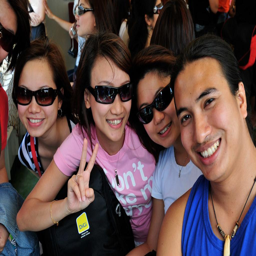

amusement_15716.jpg


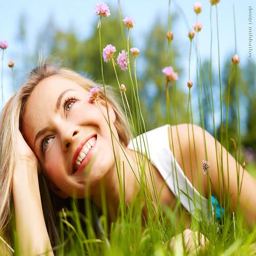

=== anger ===
anger_02538.jpg


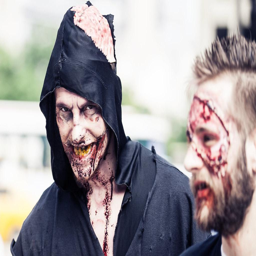

anger_06597.jpg


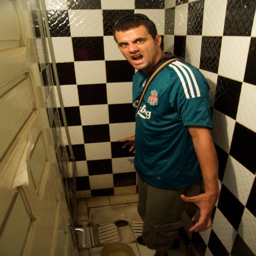

=== awe ===
awe_04597.jpg


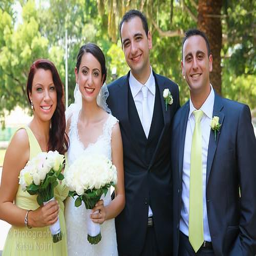

syn_01971.png


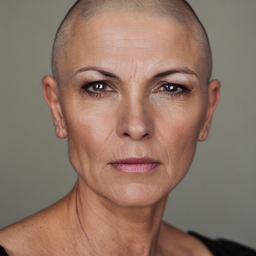

=== contentment ===
contentment_13016.jpg


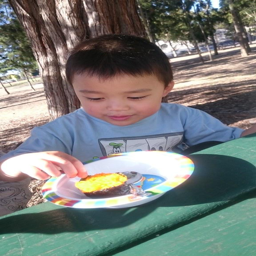

contentment_06996.jpg


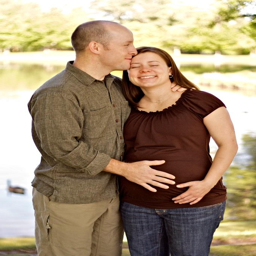

=== disgust ===
syn_01096.png


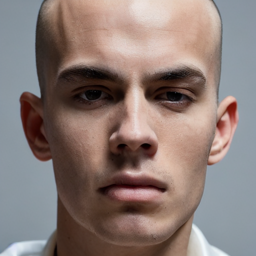

syn_01102.png


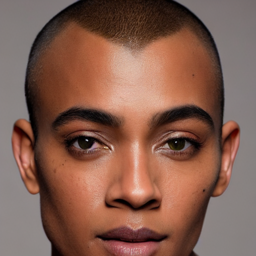

=== excitement ===
excitement_19686.jpg


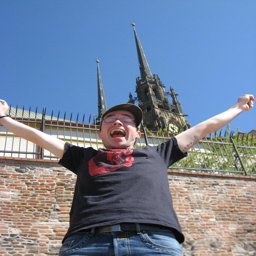

excitement_10760.jpg


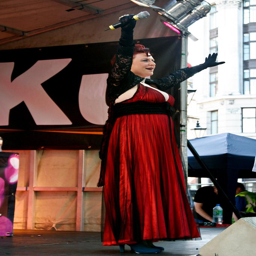

=== fear ===
syn_01713.png


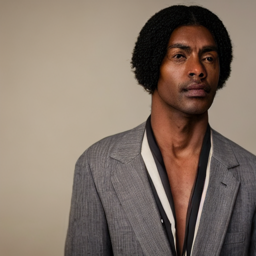

syn_01616.png


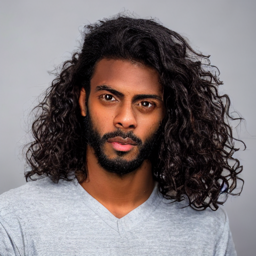

=== sadness ===
sadness_00107.jpg


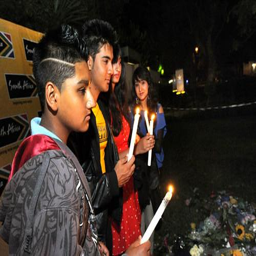

sadness_06858.jpg


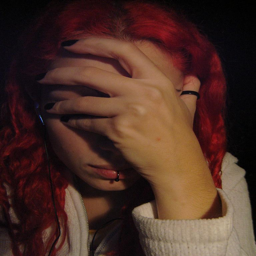

In [27]:
# ==========================================
# Cell 11 — (Optional) Quick visual check
# ==========================================
import random
from IPython.display import display

def show_random_samples(root: Path, emotion: str, n: int = 4):
    folder = root / emotion
    files = [p for p in folder.iterdir() if p.suffix.lower() in IMG_EXTS]
    if not files:
        print("No files for:", emotion)
        return
    picks = random.sample(files, min(n, len(files)))
    for p in picks:
        print(p.name)
        display(Image.open(p).resize((256,256)))

# Example: show a few generated images (edit emotion name)
for e in ["amusement", "anger", "awe", "contentment", "disgust", "excitement", "fear", "sadness"]:
    print("===", e, "===")
    show_random_samples(RAW_DIR, e, n=2)